In [2]:
import os
import pandas as pd
import statsmodels.formula.api as smf

os.chdir(os.path.expanduser("/Users/ericarmstrong/Desktop"))
# Load and prep
df = pd.read_csv("econ_data v3.csv")
df['date'] = pd.to_datetime(df['date'])

# Inspect unique series names
print("Unique series names:", df['seriesName'].unique())

# Pivot
df_wide = df.pivot(index='date', columns='seriesName', values='data')

# Check available columns BEFORE dropping anything
print("\nPivoted columns:", df_wide.columns.tolist())

# Only drop rows with NaNs
df_wide = df_wide.dropna(axis=0)  # Keep all columns

# Reset index and compute pct_change
df_wide = df_wide.reset_index()
df_wide.iloc[:, 1:] = df_wide.iloc[:, 1:].pct_change(periods=1)
df_wide = df_wide.dropna()

# Confirm if needed columns exist now
required = ['NRSI511N', 'NRSV2N', 'CCIN', 'ERSI5N']
missing = [col for col in required if col not in df_wide.columns]
if missing:
    raise ValueError(f"❌ These columns are missing: {missing}")

# Check for NaNs in target + predictors
print("\nNaNs in required columns:\n", df_wide[required].isna().sum())

# Build and fit model
formula = "NRSI511N ~ GDPA + NRSV2N + YPA + CCOND"
model1 = smf.ols(formula, data=df_wide).fit()
print(model1.summary())

/Users/ericarmstrong/opt/anaconda3/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/Users/ericarmstrong/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.4' currently installed).
  from pandas.core import (


Unique series names: ['NRSI111N' 'NRSI511N' 'NRSV2N' 'CCIN' 'CCOND' 'VSMIDN' 'VSMINN' 'GDPA'
 'YPA' 'RECPROB' 'CPIUANN' 'PMEA' 'PXEA' 'ERSI5N']

Pivoted columns: ['CCIN', 'CCOND', 'CPIUANN', 'ERSI5N', 'GDPA', 'NRSI111N', 'NRSI511N', 'NRSV2N', 'PMEA', 'PXEA', 'RECPROB', 'VSMIDN', 'VSMINN', 'YPA']

NaNs in required columns:
 seriesName
NRSI511N    0
NRSV2N      0
CCIN        0
ERSI5N      0
dtype: int64
                            OLS Regression Results                            
Dep. Variable:               NRSI511N   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                     6282.
Date:                Thu, 10 Jul 2025   Prob (F-statistic):            0.00946
Time:                        14:00:25   Log-Likelihood:                 42.623
No. Observations:                   6   AIC:                            -75.25
Df Residuals:                       1   BI

/Users/ericarmstrong/opt/anaconda3/lib/python3.9/site-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 6 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


In [3]:
formula2 = 'NRSI511N ~ PMEA + PXEA + PMEA*PXEA'
model2 = smf.ols(formula2, data=df_wide).fit()
print(model2.summary())

                            OLS Regression Results                            
Dep. Variable:               NRSI511N   R-squared:                       0.646
Model:                            OLS   Adj. R-squared:                  0.114
Method:                 Least Squares   F-statistic:                     1.215
Date:                Thu, 10 Jul 2025   Prob (F-statistic):              0.481
Time:                        14:00:25   Log-Likelihood:                 15.340
No. Observations:                   6   AIC:                            -22.68
Df Residuals:                       2   BIC:                            -23.51
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0301      0.018      1.691      0.2

/Users/ericarmstrong/opt/anaconda3/lib/python3.9/site-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 6 samples were given.
  warn("omni_normtest is not valid with less than 8 observations; %i "


In [8]:
formula3 = 'NRSI511N ~ PMEA + PXEA + RECPROB + GDPA'
model3 = smf.ols(formula3, data=df_wide).fit()
print(model3.summary())

                            OLS Regression Results                            
Dep. Variable:               NRSI511N   R-squared:                       0.933
Model:                            OLS   Adj. R-squared:                  0.665
Method:                 Least Squares   F-statistic:                     3.483
Date:                Thu, 10 Jul 2025   Prob (F-statistic):              0.379
Time:                        14:01:04   Log-Likelihood:                 20.338
No. Observations:                   6   AIC:                            -30.68
Df Residuals:                       1   BIC:                            -31.72
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0090      0.016      0.568      0.6

/Users/ericarmstrong/opt/anaconda3/lib/python3.9/site-packages/statsmodels/stats/stattools.py:74: ValueWarning: omni_normtest is not valid with less than 8 observations; 6 samples were given.


In [5]:
# Generating a report using Pandas_Profiling
from ydata_profiling import ProfileReport
from plotnine import (
    ggplot, aes, geom_point, geom_smooth, labs, theme_xkcd
)
visualized_df = df.pivot(index='date', columns='seriesName', values='data')
rpt = ProfileReport(visualized_df)
rpt

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 14/14 [00:00<00:00, 977.11it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

/Users/ericarmstrong/opt/anaconda3/lib/python3.9/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 640 rows containing missing values.


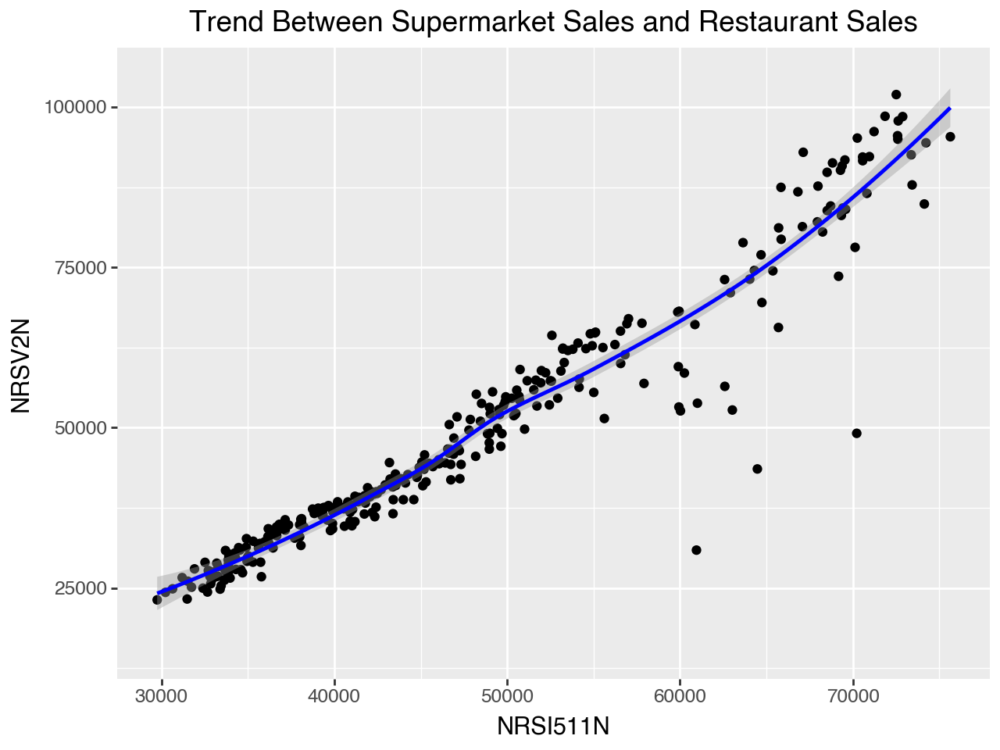

In [6]:
# Plotting relations between two different factors
ggplot (
    mapping = aes('NRSI511N', 'NRSV2N'),
    data = visualized_df
) \
    + geom_point() \
    + geom_smooth(
        method = 'loess',
        span = 0.8,
        color = 'blue'
    ) \
    + labs(
        title = 'Trend Between Supermarket Sales and Restaurant Sales'
    )

/Users/ericarmstrong/opt/anaconda3/lib/python3.9/site-packages/plotnine/layer.py:364: PlotnineWarning: geom_point : Removed 904 rows containing missing values.


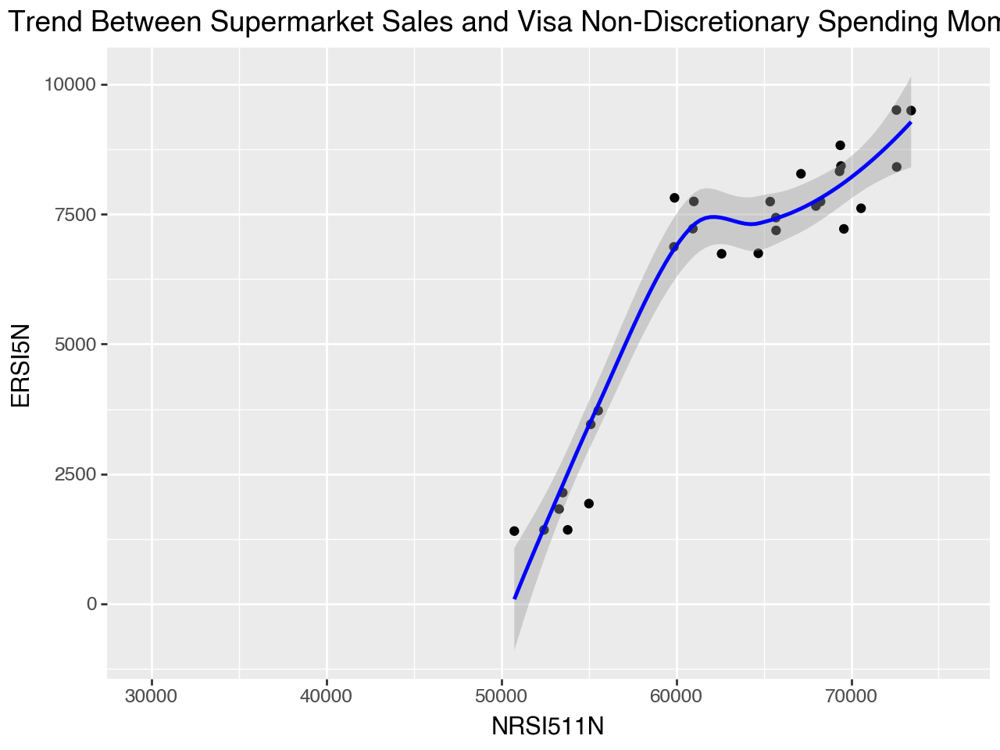

In [7]:
ggplot (
    mapping = aes('NRSI511N', 'ERSI5N'),
    data = visualized_df
) \
    + geom_point() \
    + geom_smooth(
        method = 'loess',
        span = 0.8,
        color = 'blue'
    ) \
    + labs(
        title = 'Trend Between Supermarket Sales and Visa Non-Discretionary Spending Momentum'
    )